In [42]:
import pandas as pd

df = pd.read_csv('/content/owid-covid-data.csv.zip')

In [43]:
display(df.head())

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN


In [63]:
missing_percentage = df.isnull().sum() / len(df) * 100
display(missing_percentage)

columns_to_drop = missing_percentage[missing_percentage > 90].index
df_cleaned = df.drop(columns=columns_to_drop)

df_cleaned['new_cases'] = df_cleaned['new_cases'].fillna(0)

for col in df_cleaned.select_dtypes(include=['float64', 'int64']).columns:
    if col != 'new_cases':
        df_cleaned[col] = df_cleaned[col].fillna(df_cleaned[col].mean())

df_cleaned['date'] = pd.to_datetime(df_cleaned['date'])

continents = ['Asia', 'Europe', 'North America', 'South America', 'Africa', 'Oceania']
df_cleaned = df_cleaned[df_cleaned['continent'].isin(continents)]



,0
iso_code,0.000000
continent,5.985835
location,0.000000
date,0.000000
total_cases,1.823527
...,...
human_development_index,18.080757
excess_mortality_cumulative_absolute,96.575400
excess_mortality_cumulative,96.575400
excess_mortality,96.575400


In [64]:
display(df_cleaned.head())

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,11565.595138,57664.07353,171.137304,172.673031,...,1803.987,13.579761,597.029,9.59,10.627229,32.778221,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,11565.595138,57664.07353,171.137304,172.673031,...,1803.987,13.579761,597.029,9.59,10.627229,32.778221,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,11565.595138,57664.07353,171.137304,172.673031,...,1803.987,13.579761,597.029,9.59,10.627229,32.778221,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,11565.595138,57664.07353,171.137304,172.673031,...,1803.987,13.579761,597.029,9.59,10.627229,32.778221,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,11565.595138,57664.07353,171.137304,172.673031,...,1803.987,13.579761,597.029,9.59,10.627229,32.778221,37.746,0.5,64.83,0.511


In [66]:
display(df_cleaned.shape)

(156370, 59)

In [68]:
display(df_cleaned.dtypes)

,0
iso_code,object
continent,object
location,object
date,datetime64[ns]
total_cases,float64
new_cases,float64
new_cases_smoothed,float64
total_deaths,float64
new_deaths,float64
new_deaths_smoothed,float64


In [46]:
# Convert date column to datetime
df['date'] = pd.to_datetime(df['date'])

# Keep only country-level rows (drop aggregates like “World”, “International”, continents)
# Assuming 'continent' column can be used to identify non-country rows if 'location' includes aggregates
continents = ['Asia', 'Europe', 'North America', 'South America', 'Africa', 'Oceania']
df_cleaned = df[df['continent'].isin(continents)].copy()


# Handle missing values:
# Fill 0 for new_cases and new_deaths.
df_cleaned['new_cases'] = df_cleaned['new_cases'].fillna(0)
df_cleaned['new_deaths'] = df_cleaned['new_deaths'].fillna(0)

# Forward-fill totals (total_cases, total_deaths).
df_cleaned['total_cases'] = df_cleaned['total_cases'].fillna(method='ffill')
df_cleaned['total_deaths'] = df_cleaned['total_deaths'].fillna(method='ffill')

# Leave demographic/economic columns as they are (for uncertainty discussion).
# This step is implicitly handled by not applying fillna to other columns

# Display missing values summary after initial cleaning
display("Missing values after filling new_cases, new_deaths, and forward-filling total_cases, total_deaths:")
display(df_cleaned.isnull().sum())

# Save cleaned dataset as owid_covid_cleaned.csv.
df_cleaned.to_csv('owid_covid_cleaned.csv', index=False)

/tmp/ipython-input-2379388294.py:16: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_cleaned['total_cases'] = df_cleaned['total_cases'].fillna(method='ffill')
/tmp/ipython-input-2379388294.py:17: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_cleaned['total_deaths'] = df_cleaned['total_deaths'].fillna(method='ffill')


'Missing values after filling new_cases, new_deaths, and forward-filling total_cases, total_deaths:'

,0
iso_code,0
continent,0
location,0
date,0
total_cases,0
...,...
human_development_index,20891
excess_mortality_cumulative_absolute,150674
excess_mortality_cumulative,150674
excess_mortality,150674


## Present results



In [69]:
display(df_cleaned.head())

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,11565.595138,57664.07353,171.137304,172.673031,...,1803.987,13.579761,597.029,9.59,10.627229,32.778221,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,11565.595138,57664.07353,171.137304,172.673031,...,1803.987,13.579761,597.029,9.59,10.627229,32.778221,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,11565.595138,57664.07353,171.137304,172.673031,...,1803.987,13.579761,597.029,9.59,10.627229,32.778221,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,11565.595138,57664.07353,171.137304,172.673031,...,1803.987,13.579761,597.029,9.59,10.627229,32.778221,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,11565.595138,57664.07353,171.137304,172.673031,...,1803.987,13.579761,597.029,9.59,10.627229,32.778221,37.746,0.5,64.83,0.511


In [70]:
display(df_cleaned.shape)

(156370, 59)

In [71]:
display(df_cleaned.columns)

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',

In [72]:
display(df_cleaned.info())

<class 'pandas.core.frame.DataFrame'>
Index: 156370 entries, 0 to 166325
Data columns (total 59 columns):
 #   Column                                      Non-Null Count   Dtype         
---  ------                                      --------------   -----         
 0   iso_code                                    156370 non-null  object        
 1   continent                                   156370 non-null  object        
 2   location                                    156370 non-null  object        
 3   date                                        156370 non-null  datetime64[ns]
 4   total_cases                                 156370 non-null  float64       
 5   new_cases                                   156370 non-null  float64       
 6   new_cases_smoothed                          156370 non-null  float64       
 7   total_deaths                                156370 non-null  float64       
 8   new_deaths                                  156370 non-null  float64       
 9 

None

In [73]:
display(df_cleaned.isnull().sum())

,0
iso_code,0
continent,0
location,0
date,0
total_cases,0
new_cases,0
new_cases_smoothed,0
total_deaths,0
new_deaths,0
new_deaths_smoothed,0


## Exploratory Data Analysis (EDA)



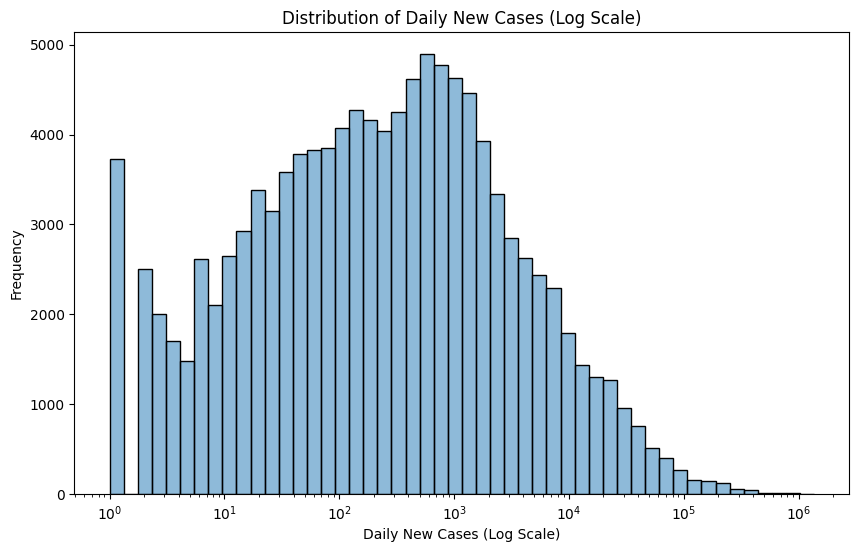

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.figure(figsize=(10, 6))
# Using log scale on the x-axis to better visualize the distribution of lower values
sns.histplot(df_cleaned['new_cases'], bins=50, kde=True, log_scale=True)
plt.title('Distribution of Daily New Cases (Log Scale)')
plt.xlabel('Daily New Cases (Log Scale)')
plt.ylabel('Frequency')
plt.show()

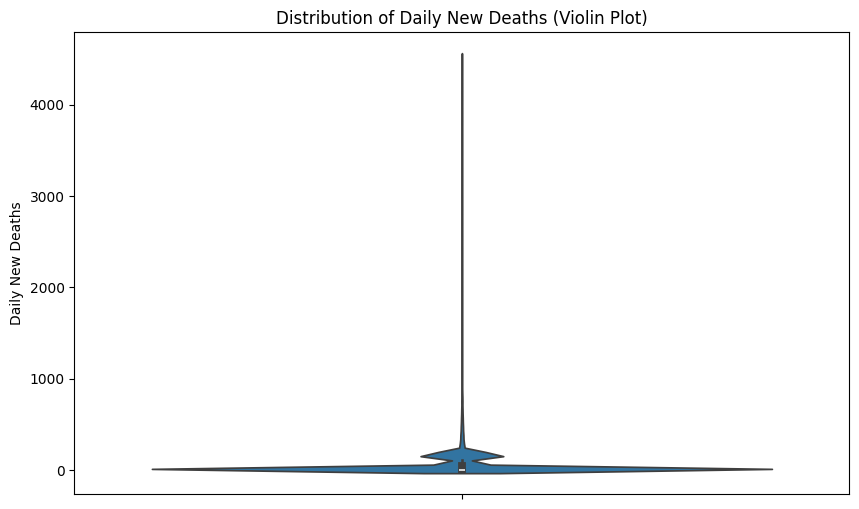

In [76]:
plt.figure(figsize=(10, 6))
sns.violinplot(y=df_cleaned['new_deaths'])
plt.title('Distribution of Daily New Deaths (Violin Plot)')
plt.ylabel('Daily New Deaths')
plt.show()

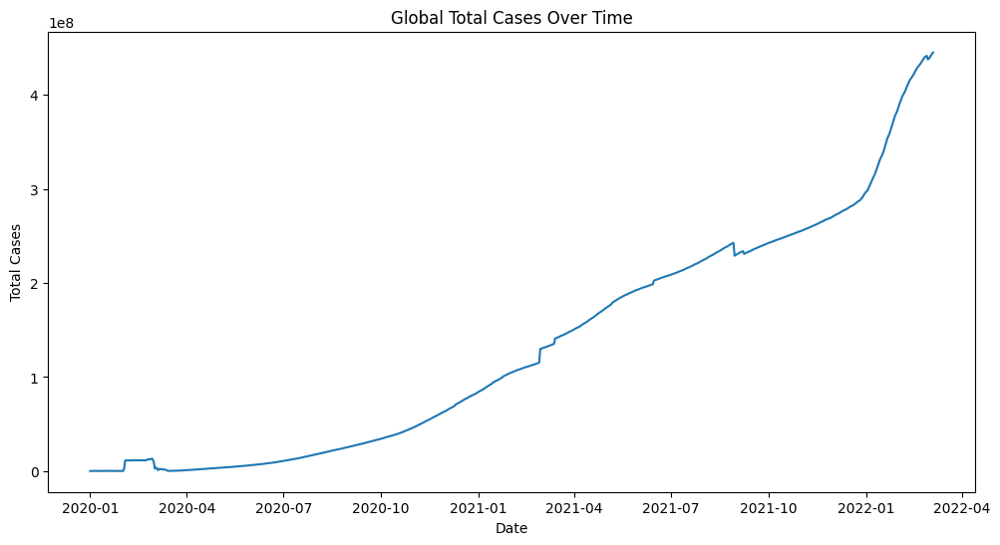

In [50]:
global_cases = df_cleaned.groupby('date')['total_cases'].sum().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=global_cases, x='date', y='total_cases')
plt.title('Global Total Cases Over Time')
plt.xlabel('Date')
plt.ylabel('Total Cases')
plt.show()

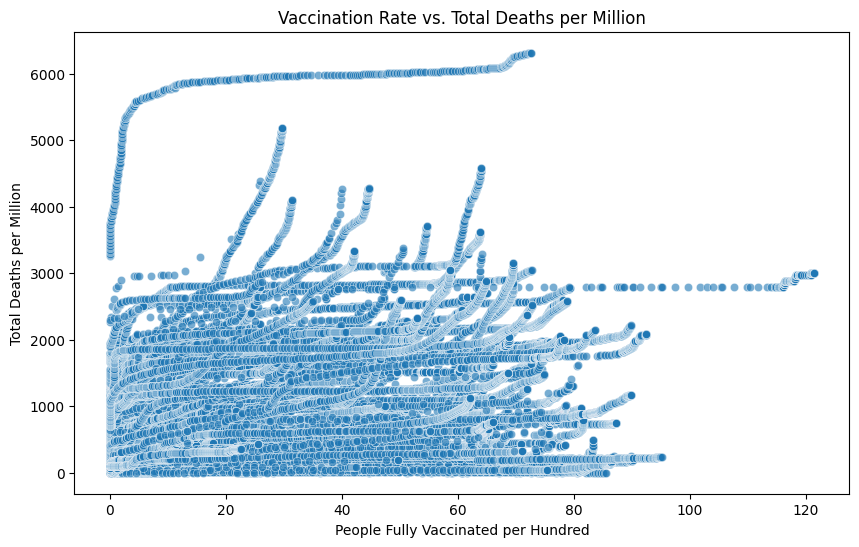

In [51]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_cleaned, x='people_fully_vaccinated_per_hundred', y='total_deaths_per_million', alpha=0.6)
plt.title('Vaccination Rate vs. Total Deaths per Million')
plt.xlabel('People Fully Vaccinated per Hundred')
plt.ylabel('Total Deaths per Million')
plt.show()

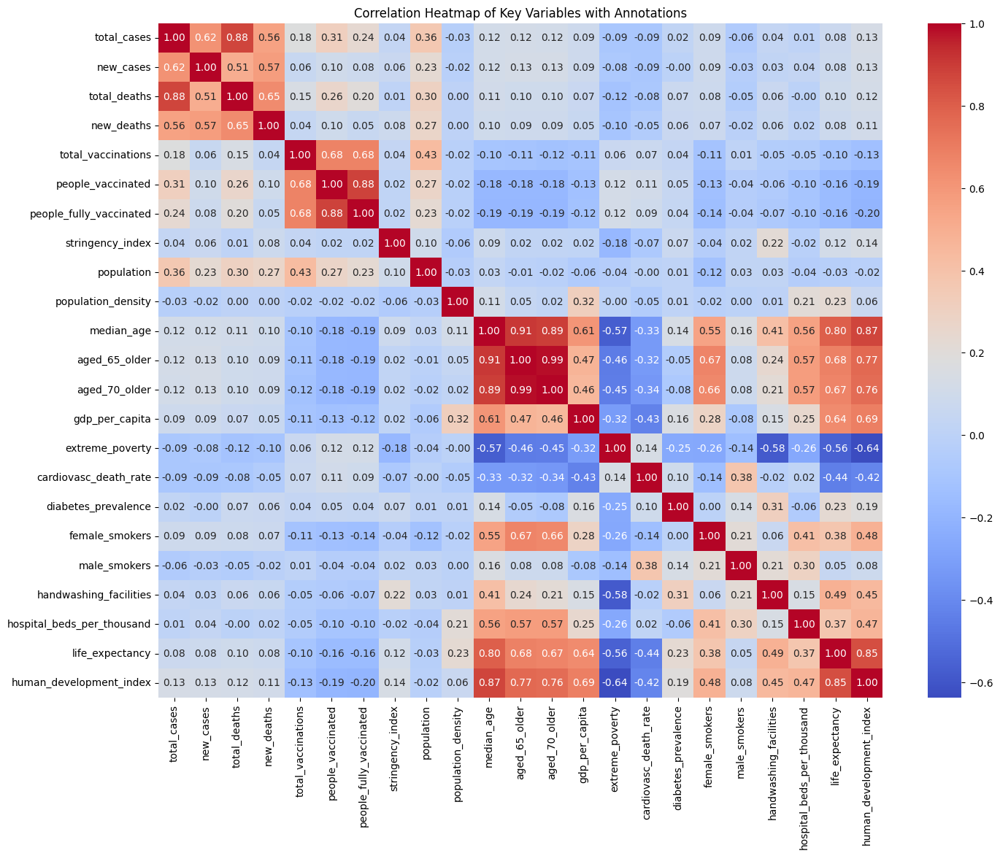

In [74]:
# Select relevant numerical columns for the heatmap
correlation_columns = [
    'total_cases', 'new_cases', 'total_deaths', 'new_deaths',
    'total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated',
    'stringency_index', 'population', 'population_density', 'median_age',
    'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
    'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
    'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
    'life_expectancy', 'human_development_index'
]

# Calculate the correlation matrix, dropping columns that don't exist in the cleaned dataframe
existing_correlation_columns = [col for col in correlation_columns if col in df_cleaned.columns]
correlation_matrix = df_cleaned[existing_correlation_columns].corr()

plt.figure(figsize=(16, 12)) # Increased figure size for better readability with annotations
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f") # Set annot=True and fmt to display values
plt.title('Correlation Heatmap of Key Variables with Annotations')
plt.show()

## Sample Visualizations



/tmp/ipython-input-3196511719.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_10_countries, x='total_cases', y='location', palette='viridis')


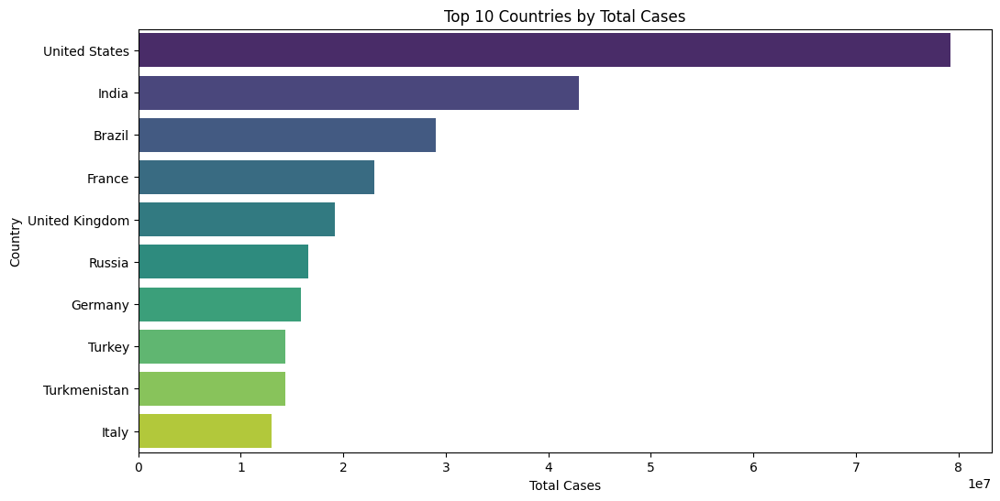

In [53]:
# Get the latest total cases for each country
latest_cases = df_cleaned.groupby('location')['total_cases'].last().reset_index()

# Sort by total cases and get the top 10
top_10_countries = latest_cases.sort_values(by='total_cases', ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(data=top_10_countries, x='total_cases', y='location', palette='viridis')
plt.title('Top 10 Countries by Total Cases')
plt.xlabel('Total Cases')
plt.ylabel('Country')
plt.show()


To create a world map of cases per million for the latest available date, I need to find the latest data entry for each country, and then use Plotly Express to generate a choropleth map. This requires installing Plotly Express first.

In [54]:
%pip install plotly_express

In [55]:
import plotly_express as px

# Get the latest data for each country
latest_data = df_cleaned.loc[df_cleaned.groupby('location')['date'].idxmax()]

# Create the world map
fig = px.choropleth(latest_data,
                    locations="iso_code",
                    color="total_cases_per_million",
                    hover_name="location",
                    hover_data=["total_cases", "total_deaths", "population"],
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title="World Map of Total Cases per Million (Latest Data)")
fig.show()

## Narrative visualization & storytelling

Compare continents (Asia vs Europe vs Africa) and highlight outliers (e.g., India’s 2021 wave, Africa’s lower death rate).


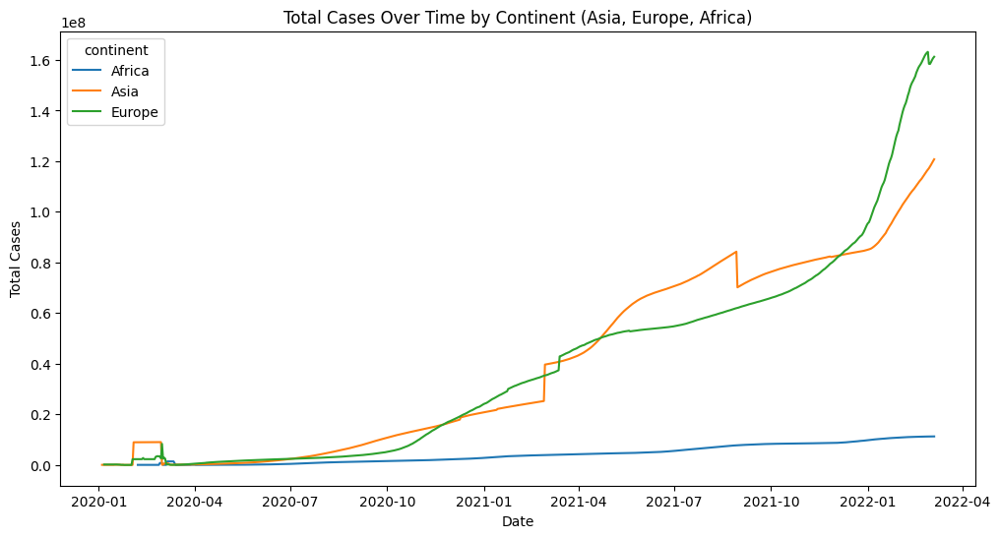

In [56]:
# Filter data for Asia, Europe, and Africa
continental_df = df_cleaned[df_cleaned['continent'].isin(['Asia', 'Europe', 'Africa'])].copy()

# Group by continent and date and sum total cases and deaths
continental_trends = continental_df.groupby(['continent', 'date'])[['total_cases', 'total_deaths']].sum().reset_index()

# Plot total cases over time for each continent
plt.figure(figsize=(12, 6))
sns.lineplot(data=continental_trends, x='date', y='total_cases', hue='continent')
plt.title('Total Cases Over Time by Continent (Asia, Europe, Africa)')
plt.xlabel('Date')
plt.ylabel('Total Cases')
plt.show()

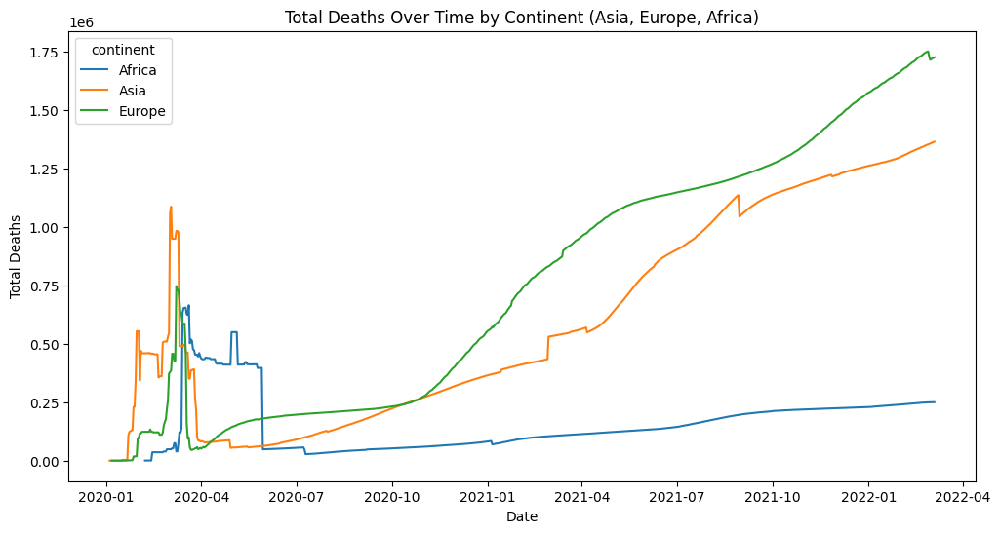

In [57]:
# Plot total deaths over time for each continent
plt.figure(figsize=(12, 6))
sns.lineplot(data=continental_trends, x='date', y='total_deaths', hue='continent')
plt.title('Total Deaths Over Time by Continent (Asia, Europe, Africa)')
plt.xlabel('Date')
plt.ylabel('Total Deaths')
plt.show()

**Reasoning**:
Filter the DataFrame to include only data for India and plot the 'new_cases' over time to visualize the 2021 wave.



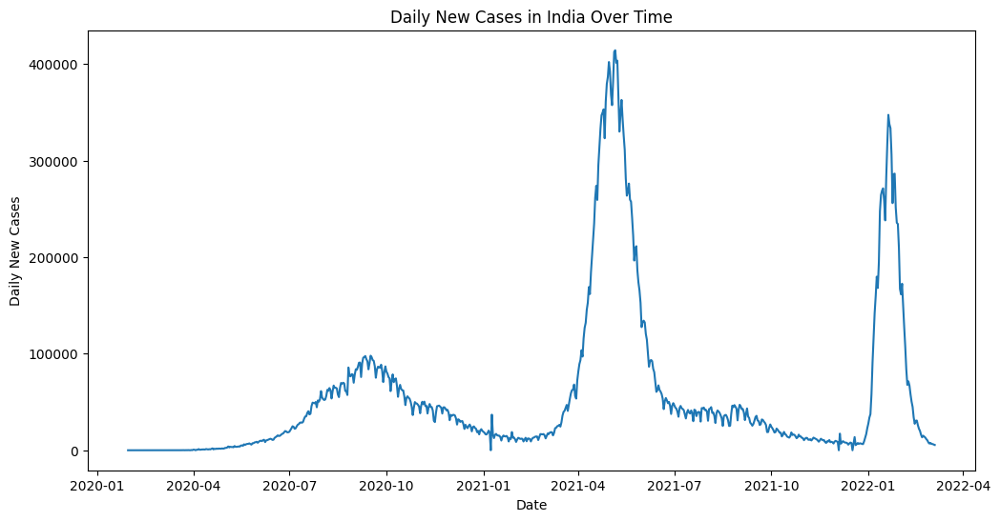

In [58]:
# Filter data for India
india_df = df_cleaned[df_cleaned['location'] == 'India'].copy()

# Plot new cases over time for India
plt.figure(figsize=(12, 6))
sns.lineplot(data=india_df, x='date', y='new_cases')
plt.title("Daily New Cases in India Over Time")
plt.xlabel('Date')
plt.ylabel('Daily New Cases')
plt.show()

In [59]:
# Get the latest data for each continent
latest_continental_data = df_cleaned.loc[df_cleaned.groupby('continent')['date'].idxmax()]

# Calculate total deaths per million for each continent
latest_continental_data['total_deaths_per_million'] = (latest_continental_data['total_deaths'] / latest_continental_data['population']) * 1000000

# Display the total deaths per million for the specified continents
display("Total Deaths per Million (Latest Data) by Continent:")
display(latest_continental_data[latest_continental_data['continent'].isin(['Asia', 'Europe', 'Africa'])][['continent', 'total_deaths_per_million']])

'Total Deaths per Million (Latest Data) by Continent:'

,continent,total_deaths_per_million
2972,Africa,153.597450
740,Asia,191.337219
2232,Europe,1210.609085


## Narrative visualization & storytelling



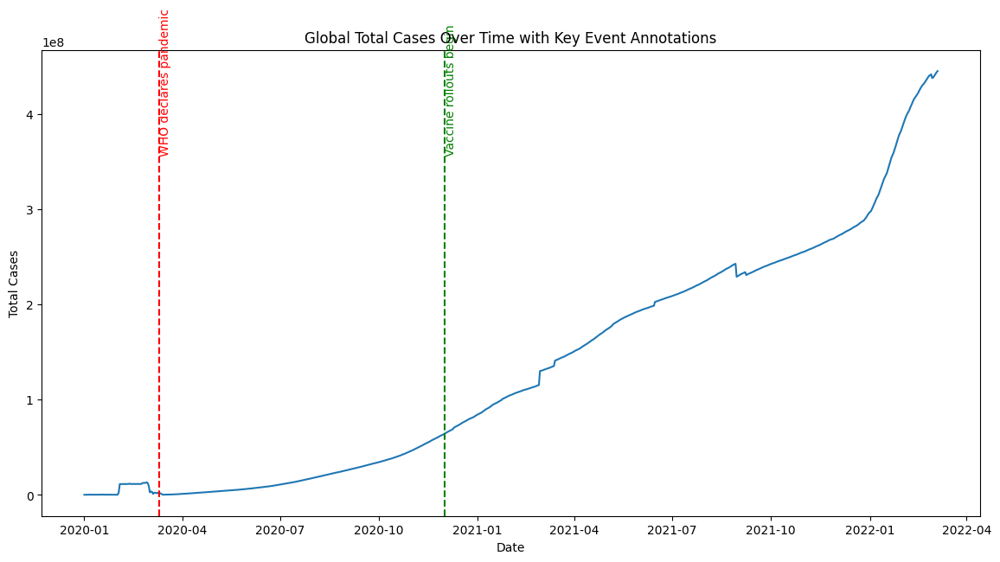

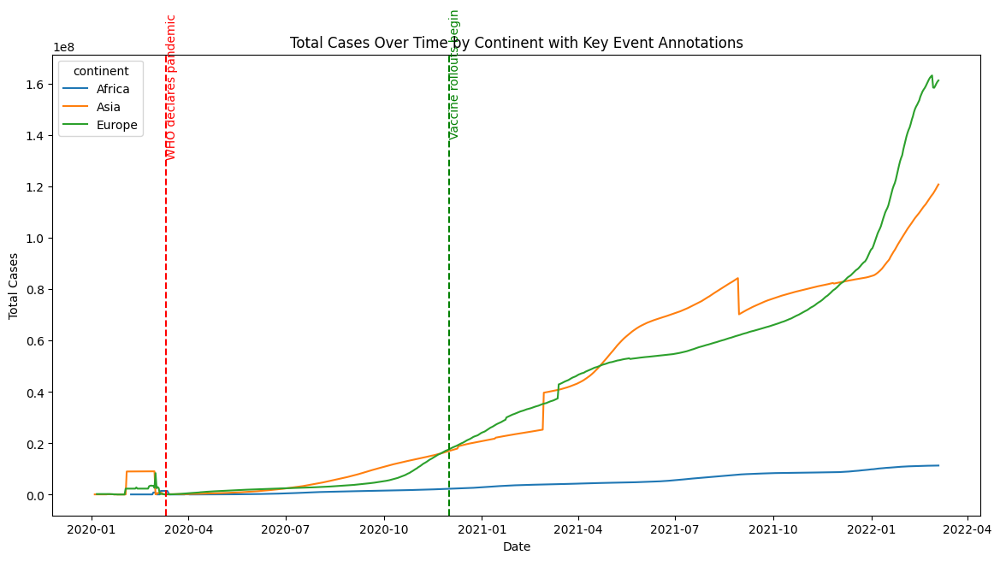

In [60]:
# Key dates for annotations
annotations = [
    {'date': '2020-03-11', 'text': 'WHO declares pandemic', 'color': 'red'},
    {'date': '2020-12-01', 'text': 'Vaccine rollouts begin', 'color': 'green'}
]

# Plot global total cases over time with annotations
global_cases = df_cleaned.groupby('date')['total_cases'].sum().reset_index()

plt.figure(figsize=(14, 7))
sns.lineplot(data=global_cases, x='date', y='total_cases')
plt.title('Global Total Cases Over Time with Key Event Annotations')
plt.xlabel('Date')
plt.ylabel('Total Cases')

for annotation in annotations:
    plt.axvline(pd.to_datetime(annotation['date']), color=annotation['color'], linestyle='--', lw=1.5)
    plt.text(pd.to_datetime(annotation['date']), global_cases['total_cases'].max() * 0.8, annotation['text'], rotation=90, color=annotation['color'], va='bottom')

plt.show()

# Plot total cases over time by continent with annotations
continental_df = df_cleaned[df_cleaned['continent'].isin(['Asia', 'Europe', 'Africa'])].copy()
continental_trends = continental_df.groupby(['continent', 'date'])[['total_cases', 'total_deaths']].sum().reset_index()

plt.figure(figsize=(14, 7))
sns.lineplot(data=continental_trends, x='date', y='total_cases', hue='continent')
plt.title('Total Cases Over Time by Continent with Key Event Annotations')
plt.xlabel('Date')
plt.ylabel('Total Cases')

for annotation in annotations:
    plt.axvline(pd.to_datetime(annotation['date']), color=annotation['color'], linestyle='--', lw=1.5)
    # Adjust text position for continental plot to avoid overlap
    plt.text(pd.to_datetime(annotation['date']), continental_trends['total_cases'].max() * (0.8 + 0.05 * annotations.index(annotation)), annotation['text'], rotation=90, color=annotation['color'], va='bottom')


plt.show()

In [61]:
# Create a time-series animated map
fig = px.choropleth(df_cleaned,
                    locations="iso_code",
                    color="total_cases_per_million",
                    hover_name="location",
                    hover_data=["total_cases", "total_deaths", "population"],
                    animation_frame="date",
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title="Spread of Total Cases per Million Over Time")
fig.show()

## Summary:

### Data Analysis Key Findings

*   The analysis of global total cases over time reveals distinct waves and peaks in infections.
*   A scatterplot suggests a potential negative correlation between vaccination rates and total deaths per million.
*   Comparing continents, Europe and Asia show higher total cases and deaths over time compared to Africa.
*   India experienced a significant surge in daily new cases in 2021, standing out as a regional outlier.
*   The latest data indicates that Africa has a notably lower total deaths per million compared to Europe and Asia.

### Insights or Next Steps

*   The observed differences in death rates per million across continents warrant further investigation into potential contributing factors such as age demographics, healthcare infrastructure, and data reporting variations.
*   The relationship between vaccination rates and death rates could be explored in more detail, perhaps by analyzing different vaccine types or the timing of rollouts relative to infection waves.
